In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

### Create synthetic data using Scikit learn `make_blob` method

In [13]:
from sklearn.datasets import make_classification
from sklearn.datasets import make_blobs

In [14]:
n_features = 8
n_cluster = 5
cluster_std = 2.5
n_samples = 1000

In [15]:
data1 = make_blobs(n_samples=n_samples,n_features=n_features,
                   centers=n_cluster,cluster_std=cluster_std,random_state=101)

In [16]:
d1 = data1[0]

In [17]:
df1=pd.DataFrame(data=d1,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
df1.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,6.945929,-10.349495,-1.636670,-1.543522,-6.874959,6.365005,10.873928,-7.123310
1,-4.684464,2.869150,3.414020,-2.894234,4.004073,0.242351,-6.277994,-10.701493
2,-1.566196,2.012496,-10.396981,-7.547533,2.482701,13.839124,-3.603464,5.794733
3,3.930389,1.226708,-8.650491,-3.739326,4.154532,2.761068,-5.501887,9.684233
4,-4.889094,8.929035,-0.043964,4.306554,3.728588,2.477815,6.228629,2.925896


In [18]:
from itertools import combinations

In [19]:
lst_vars=list(combinations(df1.columns,2))

In [20]:
len(lst_vars)

28

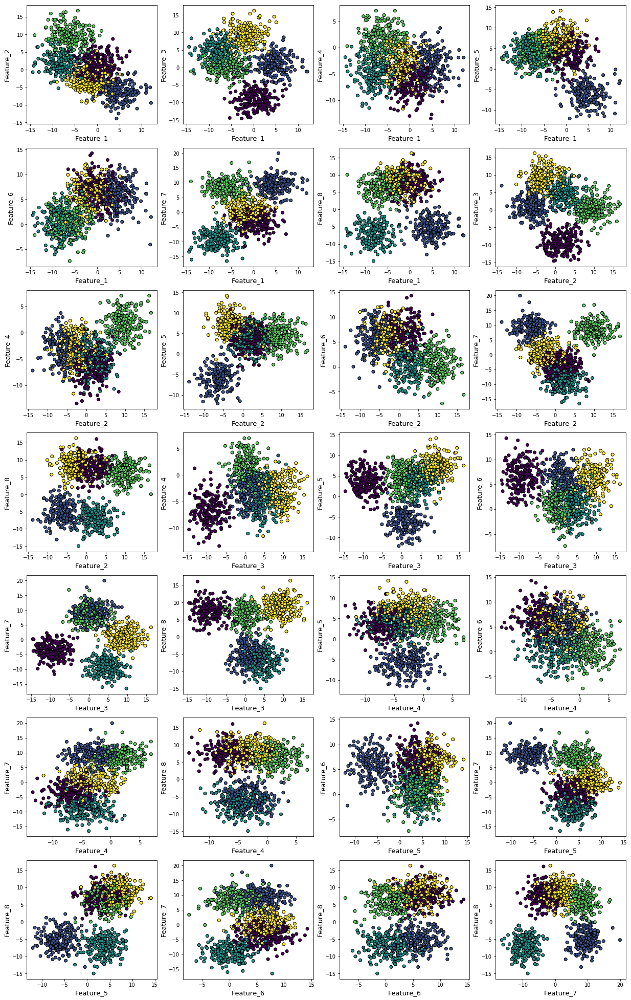

In [21]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=data1[1],edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [22]:
df1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Feature_1,1000.0,-2.148478,5.228336,-14.452306,-6.385520,-2.111526,1.954092,12.067048
Feature_2,1000.0,0.836243,6.007993,-13.856791,-3.954335,0.428336,4.817313,16.707577
Feature_3,1000.0,1.168609,6.588819,-14.625560,-2.091540,1.594867,5.874721,16.233177
Feature_4,1000.0,-3.112525,3.698634,-13.462665,-5.789735,-3.457124,-0.458017,6.984834
Feature_5,1000.0,2.638227,5.138207,-12.071448,0.469349,3.818135,6.231495,14.167456
Feature_6,1000.0,3.990117,3.840617,-7.391192,1.236524,4.259066,6.954224,14.271554
Feature_7,1000.0,1.149663,7.519774,-16.517391,-5.061081,0.979880,8.103205,19.961218
Feature_8,1000.0,2.084073,7.237652,-14.959413,-5.200666,4.881183,8.204309,16.304647


### How are the classes separated (boxplots)

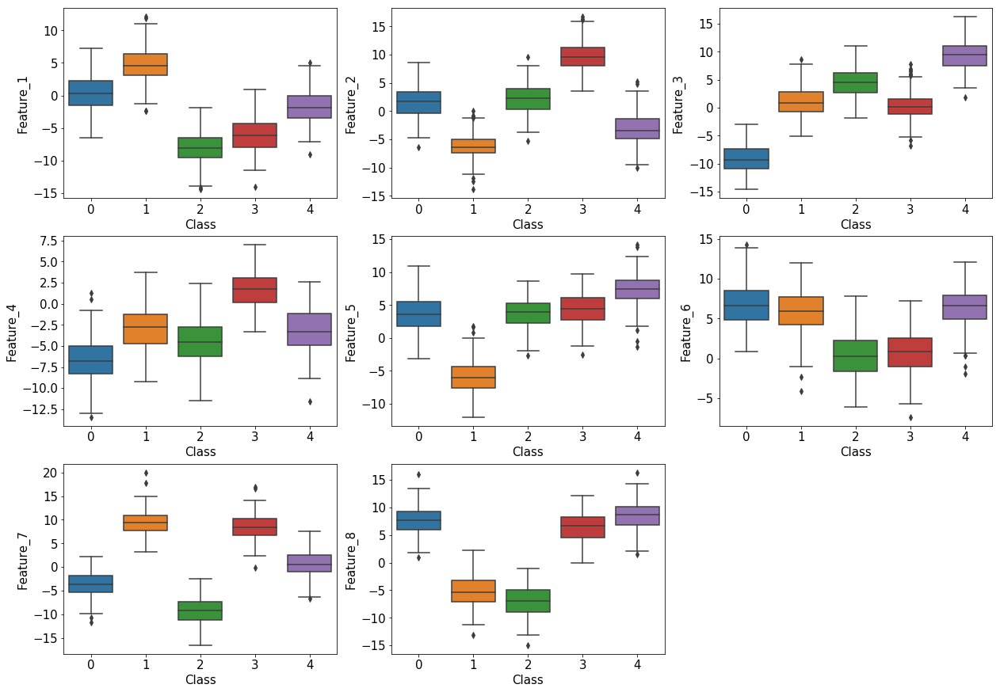

In [23]:
plt.figure(figsize=(21,15))
for i,c in enumerate(df1.columns):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df1[c],x=data1[1])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel("Class",fontsize=15)
    plt.ylabel(c,fontsize=15)
    #plt.show()

## k-means clustering

In [24]:
from sklearn.cluster import KMeans

### Unlabled data

In [25]:
X=df1

In [26]:
X.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,6.945929,-10.349495,-1.636670,-1.543522,-6.874959,6.365005,10.873928,-7.123310
1,-4.684464,2.869150,3.414020,-2.894234,4.004073,0.242351,-6.277994,-10.701493
2,-1.566196,2.012496,-10.396981,-7.547533,2.482701,13.839124,-3.603464,5.794733
3,3.930389,1.226708,-8.650491,-3.739326,4.154532,2.761068,-5.501887,9.684233
4,-4.889094,8.929035,-0.043964,4.306554,3.728588,2.477815,6.228629,2.925896


In [27]:
y=data1[1]

### Scaling

In [28]:
from sklearn.preprocessing import MinMaxScaler

In [29]:
scaler = MinMaxScaler()

In [30]:
X_scaled=scaler.fit_transform(X)

### Metrics

In [31]:
from sklearn.metrics.cluster import adjusted_mutual_info_score

In [32]:
from sklearn.metrics import silhouette_score

In [33]:
from sklearn.metrics import adjusted_rand_score

In [34]:
from sklearn.metrics import completeness_score

In [35]:
from sklearn.metrics.cluster import homogeneity_score

In [36]:
from sklearn.metrics import v_measure_score

### Running k-means and computing inter-cluster distance score for various *k* values

In [37]:
km_sse= []
km_silhouette = []
km_vmeasure =[]
km_ami = []
km_homogeneity = []
km_completeness = []

cluster_range = (2,12)

for i in range(cluster_range[0],cluster_range[1]):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    km_sse.append(-km.score(X_scaled))
    km_silhouette.append(silhouette_score(X_scaled,preds))
    km_vmeasure.append(v_measure_score(y,preds))
    km_ami.append(adjusted_mutual_info_score(y,preds))
    km_homogeneity.append(homogeneity_score(y,preds))
    km_completeness.append(completeness_score(y,preds))
    print(f"Done for cluster {i}")

Done for cluster 2
Done for cluster 3
Done for cluster 4
Done for cluster 5
Done for cluster 6
Done for cluster 7
Done for cluster 8
Done for cluster 9
Done for cluster 10
Done for cluster 11


### Plotting various cluster evaluation metrics as function of number of clusters

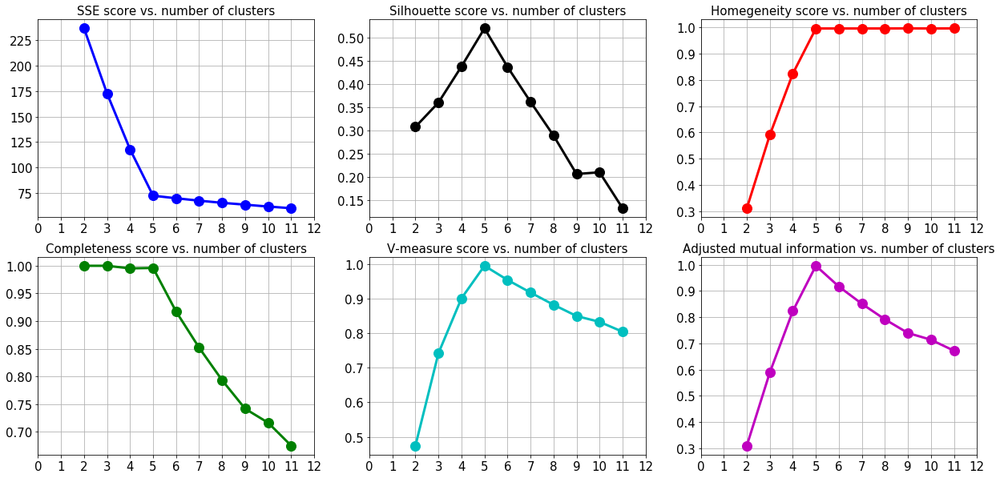

In [38]:
plt.figure(figsize=(21,10))

#SSE
plt.subplot(2,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

### Creating the baseline k-means model

In [345]:
t1=time.time()
km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)
t2=time.time()
time_km = t2-t1

In [346]:
preds_km = km.predict(X_scaled)

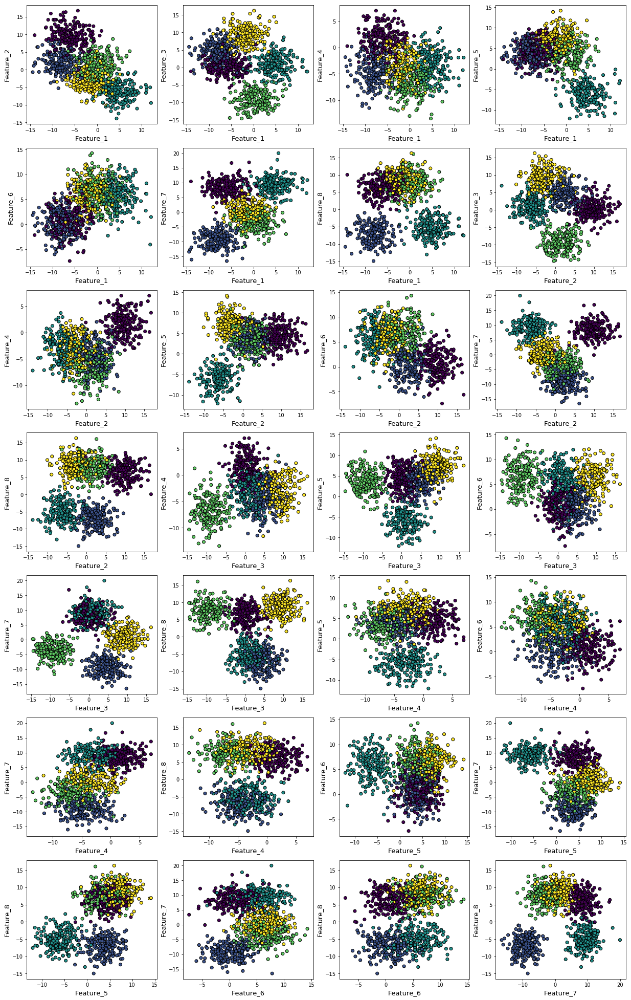

In [347]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_km,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

### Estimating average running time of k-means

In [410]:
time_km = []
for i in range(100):
    t1=time.time()
    km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)
    t2=time.time()
    delta = t2-t1
    time_km.append(delta)
time_km = np.array(time_km)
avg_time_km = time_km.mean()
print(avg_time_km)

0.0304909348487854


### Showing that evaluation metric gets blurry as the clusters' variance increases

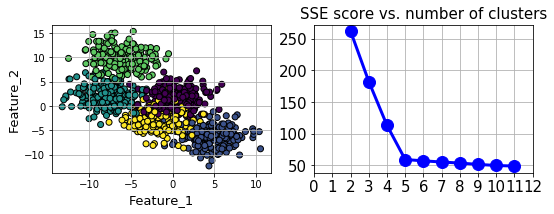

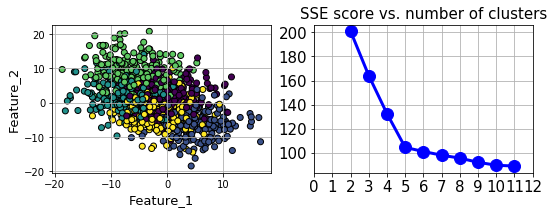

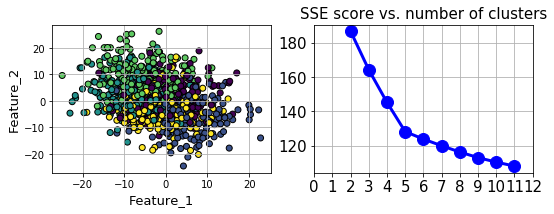

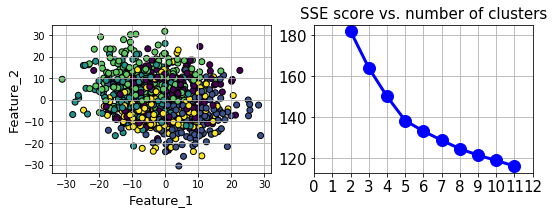

In [56]:
n_features = 8
n_cluster = 5
#cluster_std = 2.5
n_samples = 1000
cluster_range = (2,12)
j = 1
for i in range(1,5):
    data1 = make_blobs(n_samples=n_samples,n_features=n_features,
                       centers=n_cluster,cluster_std=i*2,random_state=101)
    df1=pd.DataFrame(data=data1[0],columns=['Feature_'+str(i) for i in range(1,n_features+1)])
    X=df1
    X_scaled=scaler.fit_transform(X)
    km_sse=[]
    for r in range(cluster_range[0],cluster_range[1]):
        km = KMeans(n_clusters=r, random_state=0).fit(X_scaled)
        preds = km.predict(X_scaled)
        km_sse.append(-km.score(X_scaled))
    
    plt.figure(figsize=(18,6))
    plt.subplot(2,4,2*i-1)
    plt.scatter(df1['Feature_1'],df1['Feature_2'],c=data1[1],edgecolor='k')
    plt.xlabel(f"Feature_1",fontsize=13)
    plt.ylabel(f"Feature_2",fontsize=13)
    plt.grid(True)
    
    plt.subplot(2,4,2*i)
    plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,'b-o',linewidth=3,markersize=12)
    plt.grid(True)
    plt.title("SSE score vs. number of clusters",fontsize=15)
    plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
    plt.yticks(fontsize=15)    

## Expectation-maximization (Gaussian Mixture Model)

In [58]:
from sklearn.mixture import GaussianMixture

In [61]:
n_features = 8
n_cluster = 5
cluster_std = 2.5
n_samples = 1000

data1 = make_blobs(n_samples=n_samples,n_features=n_features,
                   centers=n_cluster,cluster_std=cluster_std,random_state=101)
df1=pd.DataFrame(data=d1,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
X = df1
X_scaled=scaler.fit_transform(X)

In [62]:
gm_ll= []
gm_bic = []
gm_aic = []
gm_silhouette = []
gm_vmeasure =[]
gm_ami = []
gm_homogeneity = []
gm_completeness = []

cluster_range = (2,12)

for i in range(cluster_range[0],cluster_range[1]):
    gm = GaussianMixture(n_components=i).fit(X_scaled)
    preds = gm.predict(X_scaled)
    gm_ll.append(gm.score(X_scaled))
    gm_bic.append(-gm.bic(X_scaled))
    gm_aic.append(-gm.aic(X_scaled))
    gm_silhouette.append(silhouette_score(X_scaled,preds))
    gm_vmeasure.append(v_measure_score(y,preds))
    gm_ami.append(adjusted_mutual_info_score(y,preds))
    gm_homogeneity.append(homogeneity_score(y,preds))
    gm_completeness.append(completeness_score(y,preds))
    print(f"Done for Gaussian components {i}")


Done for Gaussian components 2
Done for Gaussian components 3
Done for Gaussian components 4
Done for Gaussian components 5
Done for Gaussian components 6
Done for Gaussian components 7
Done for Gaussian components 8
Done for Gaussian components 9
Done for Gaussian components 10
Done for Gaussian components 11


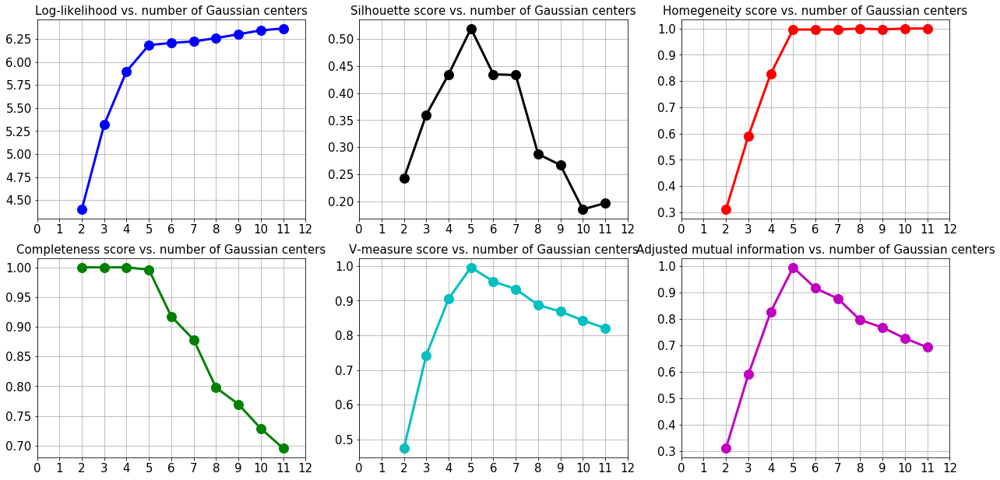

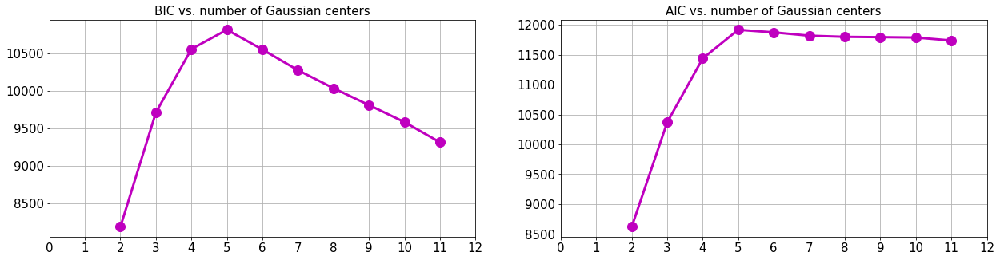

In [63]:
plt.figure(figsize=(21,16))

#SSE
plt.subplot(3,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_ll,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Log-likelihood vs. number of Gaussian centers",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(3,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of Gaussian centers",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(3,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of Gaussian centers",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(3,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of Gaussian centers",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(3,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of Gaussian centers",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(3,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of Gaussian centers",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

plt.figure(figsize=(21,5))
#BIC
plt.subplot(1,2,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_bic,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("BIC vs. number of Gaussian centers",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#AIC
plt.subplot(1,2,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_aic,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("AIC vs. number of Gaussian centers",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

### Creating the baseline Gaussian Mixture Model

In [351]:
t1=time.time()
gm = GaussianMixture(n_components=5,verbose=1,n_init=10,tol=1e-5,covariance_type='full',max_iter=500).fit(X_scaled)
t2=time.time()
time_gm = t2-t1

Initialization 0
  Iteration 0
Initialization converged: True
Initialization 1
  Iteration 0
Initialization converged: True
Initialization 2
  Iteration 0
Initialization converged: True
Initialization 3
  Iteration 0
Initialization converged: True
Initialization 4
  Iteration 0
Initialization converged: True
Initialization 5
  Iteration 0
Initialization converged: True
Initialization 6
  Iteration 0
Initialization converged: True
Initialization 7
  Iteration 0
Initialization converged: True
Initialization 8
  Iteration 0
Initialization converged: True
Initialization 9
  Iteration 0
Initialization converged: True


In [352]:
gm.means_

array([[0.72376808, 0.24754058, 0.50458996, 0.51120098, 0.23284888,
        0.61080016, 0.7089361 , 0.31307039],
       [0.24055618, 0.52715081, 0.62055001, 0.44108932, 0.60367176,
        0.35538749, 0.20000666, 0.25353223],
       [0.55883562, 0.50467346, 0.17554778, 0.333314  , 0.60016215,
        0.64729702, 0.35424429, 0.72362717],
       [0.31658249, 0.76972407, 0.48408046, 0.74032277, 0.62761312,
        0.37674866, 0.68194388, 0.6816083 ],
       [0.48078699, 0.35263628, 0.77566466, 0.5039038 , 0.73923912,
        0.63788537, 0.47549375, 0.75422349]])

In [353]:
km.cluster_centers_

array([[0.31661293, 0.76957951, 0.48410279, 0.74032848, 0.62768907,
        0.37669243, 0.68185869, 0.68167371],
       [0.24055618, 0.52715081, 0.62055001, 0.44108932, 0.60367176,
        0.35538749, 0.20000666, 0.25353223],
       [0.72376808, 0.24754058, 0.50458996, 0.51120098, 0.23284888,
        0.61080016, 0.7089361 , 0.31307039],
       [0.55883534, 0.50467351, 0.17554802, 0.33331422, 0.60016227,
        0.64729667, 0.35424436, 0.72362709],
       [0.48083121, 0.35259199, 0.77577565, 0.50379039, 0.73921335,
        0.63806145, 0.47548587, 0.75419063]])

In [354]:
gm.means_/km.cluster_centers_

array([[2.28597131, 0.32165693, 1.04231987, 0.69050562, 0.37096214,
        1.62148243, 1.03971118, 0.45926722],
       [1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        ],
       [0.77211974, 2.03875036, 0.34790185, 0.65202144, 2.57747492,
        1.05975254, 0.49968437, 2.31138813],
       [0.56650407, 1.52519213, 2.7575387 , 2.22109567, 1.04573904,
        0.58203398, 1.9250663 , 0.94193308],
       [0.99990804, 1.00012561, 0.99985693, 1.00022512, 1.00003486,
        0.99972404, 1.00001657, 1.00004357]])

In [355]:
preds_gm=gm.predict(X_scaled)

In [356]:
km_rand_score = adjusted_rand_score(preds_km,y)

In [357]:
gm_rand_score = adjusted_rand_score(preds_gm,y)

In [358]:
print("Adjusted Rand score for k-means",km_rand_score)
print("Adjusted Rand score for Gaussian Mixture model",gm_rand_score)

Adjusted Rand score for k-means 0.9974962343264018
Adjusted Rand score for Gaussian Mixture model 0.9974962343264018


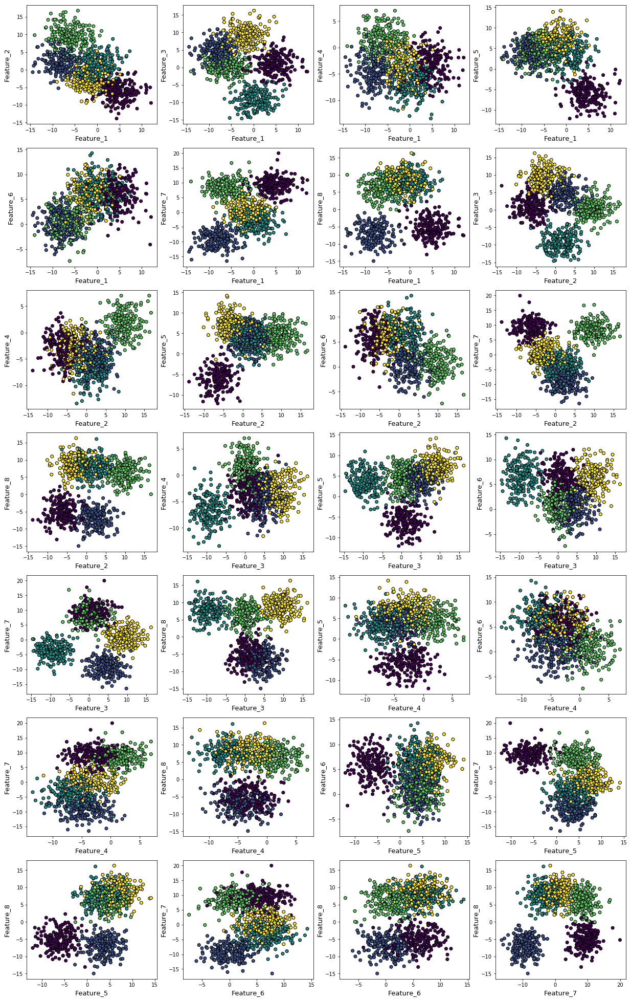

In [359]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_gm,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

### Estimating average running time of Gaussian Mixture Model

In [413]:
time_gm = []
for i in range(100):
    t1=time.time()
    gm = GaussianMixture(n_components=5,n_init=10,tol=1e-5,
                         covariance_type='full',max_iter=500).fit(X_scaled)
    t2= time.time()
    delta = t2-t1
    time_gm.append(delta)
time_gm = np.array(time_gm)
avg_time_gm = time_gm.mean()
print(avg_time_gm)

0.2310118246078491


## PCA

In [78]:
from sklearn.decomposition import PCA

In [79]:
n_prin_comp = 4

In [80]:
pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
pca_partial.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=4, random_state=None,
  svd_solver='full', tol=0.0, whiten=False)

In [81]:
pca_full = PCA(n_components=n_features,svd_solver='full')
pca_full.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=8, random_state=None,
  svd_solver='full', tol=0.0, whiten=False)

### Eigenvalues

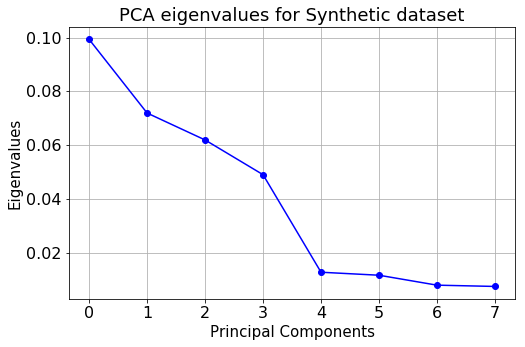

In [88]:
plt.figure(figsize=(8,5))
plt.title("PCA eigenvalues for Synthetic dataset", fontsize=18)
plt.plot(pca_full.explained_variance_,'b-o')
plt.grid(True)
plt.xticks(fontsize=16)
plt.xlabel("Principal Components",fontsize=15)
plt.yticks(fontsize=16)
plt.ylabel("Eigenvalues",fontsize=15)
plt.show()

### How much variance is explained by principal components?

In [90]:
pca_explained_var = pca_full.explained_variance_ratio_

In [91]:
cum_explaiend_var = pca_explained_var.cumsum()

In [92]:
cum_explaiend_var

array([0.30872326, 0.53226842, 0.72468435, 0.87695495, 0.91642839,
       0.95243644, 0.97696002, 1.        ])

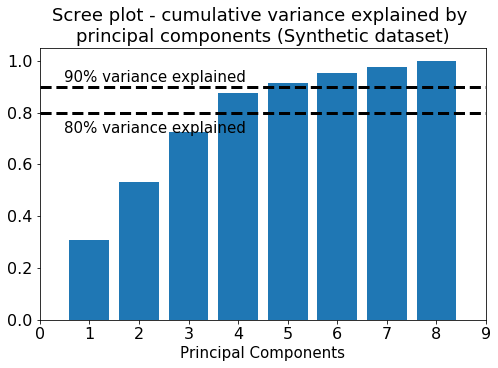

In [93]:
plt.figure(figsize=(8,5))
plt.title("Scree plot - cumulative variance explained by \nprincipal components (Synthetic dataset)", fontsize=18)
plt.bar(range(1,9),cum_explaiend_var)
plt.xticks(fontsize=16)
plt.xlabel("Principal Components",fontsize=15)
plt.yticks(fontsize=16)
plt.xlim(0,9)
plt.hlines(y=0.8,xmin=0,xmax=9,linestyles='dashed',lw=3)
plt.text(x=0.5,y=0.72,s="80% variance explained",fontsize=15)
plt.hlines(y=0.9,xmin=0,xmax=9,linestyles='dashed',lw=3)
plt.text(x=0.5,y=0.92,s="90% variance explained",fontsize=15)
plt.show()

### Transform the original variables in principal component space and create a DataFrame

In [368]:
X_pca = pca_partial.fit_transform(X_scaled)

In [369]:
df_pca=pd.DataFrame(data=X_pca,columns=['Principal_comp'+str(i) for i in range(1,n_prin_comp+1)])

### Running k-means on the transformed features

In [370]:
km_sse= []
km_silhouette = []
km_vmeasure =[]
km_ami = []
km_homogeneity = []
km_completeness = []

cluster_range = (2,12)

for i in range(cluster_range[0],cluster_range[1]):
    km = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    km_sse.append(-km.score(X_pca))
    km_silhouette.append(silhouette_score(X_pca,preds))
    km_vmeasure.append(v_measure_score(y,preds))
    km_ami.append(adjusted_mutual_info_score(y,preds))
    km_homogeneity.append(homogeneity_score(y,preds))
    km_completeness.append(completeness_score(y,preds))
    print(f"Done for cluster {i}")

Done for cluster 2
Done for cluster 3
Done for cluster 4
Done for cluster 5
Done for cluster 6
Done for cluster 7
Done for cluster 8
Done for cluster 9
Done for cluster 10
Done for cluster 11


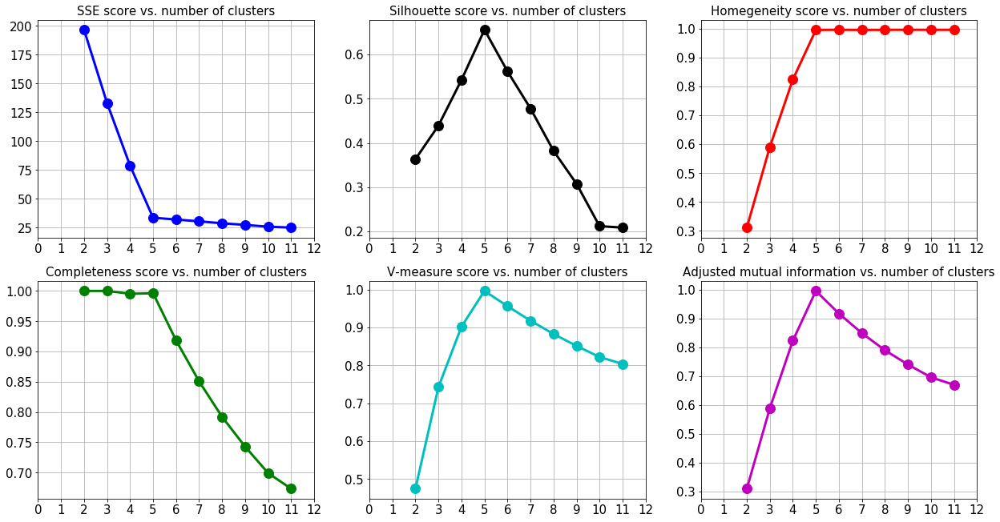

In [371]:
plt.figure(figsize=(21,11))

#SSE
plt.subplot(2,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

### K-means fitting with PCA-transformed data

In [372]:
t1=time.time()
km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
t2=time.time()
time_km_pca = t2-t1
preds_km_pca = km_pca.predict(X_pca)

### Visualizing the clusters after running k-means on PCA-transformed features

In [373]:
col_pca_combi=list(combinations(df_pca.columns,2))
num_pca_combi = len(col_pca_combi)

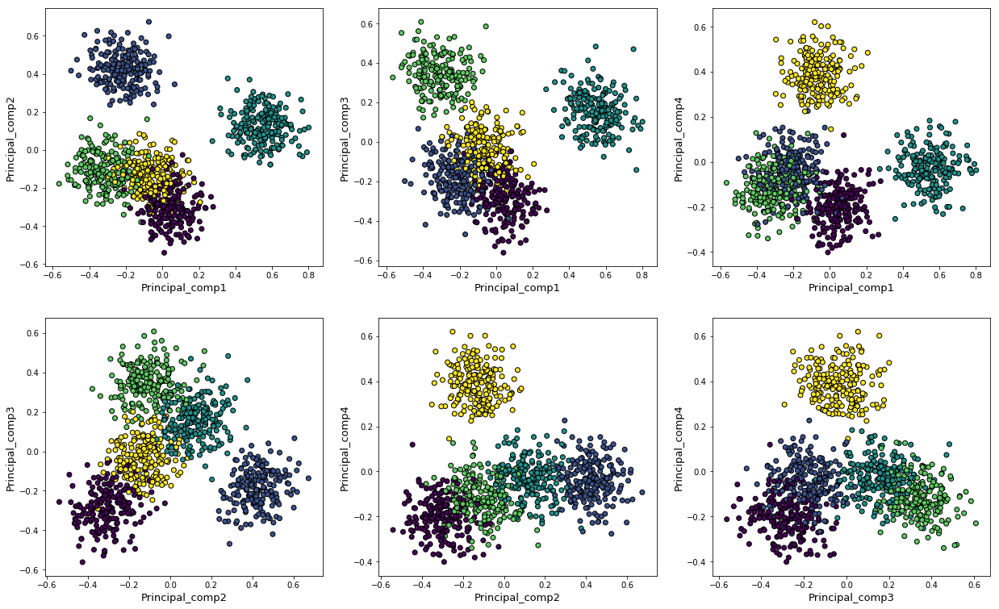

In [374]:
plt.figure(figsize=(21,20))
for i in range(1,num_pca_combi+1):
    plt.subplot(int(num_pca_combi/3)+1,3,i)
    dim1=col_pca_combi[i-1][0]
    dim2=col_pca_combi[i-1][1]
    plt.scatter(df_pca[dim1],df_pca[dim2],c=preds_km_pca,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

### Estimating average running time of k-means with PCA

In [414]:
time_km_pca = []
for i in range(100):
    t1=time.time()
    km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
    t2= time.time()
    delta = t2-t1
    time_km_pca.append(delta)
time_km_pca = np.array(time_km_pca)
avg_time_km_pca = time_km_pca.mean()
print(avg_time_km_pca)

0.026751580238342284


## ICA

In [66]:
from sklearn.decomposition import FastICA

In [67]:
n_ind_comp = 4

In [68]:
ica_partial = FastICA(n_components=n_ind_comp)
ica_partial.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=200,
    n_components=4, random_state=None, tol=0.0001, w_init=None,
    whiten=True)

In [69]:
ica_full = FastICA(max_iter=1000)
ica_full.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=1000,
    n_components=None, random_state=None, tol=0.0001, w_init=None,
    whiten=True)

In [70]:
X_ica = ica_partial.fit_transform(X_scaled)

In [71]:
df_ica=pd.DataFrame(data=X_ica,columns=['Independent_comp'+str(i) for i in range(1,n_ind_comp+1)])

### Kurtosis

In [72]:
from scipy.stats import kurtosis

In [74]:
kurtosis(X_ica,fisher=False)

array([1.82348071, 1.63377163, 1.62408163, 1.71977522])

In [94]:
X_ica_full = ica_full.fit_transform(X_scaled)

In [100]:
kurt = kurtosis(X_ica_full,fisher=True)

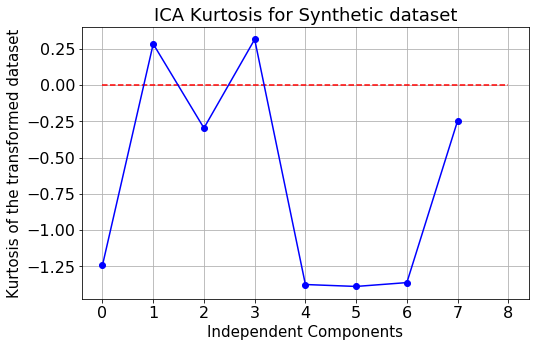

In [109]:
plt.figure(figsize=(8,5))
plt.title("ICA Kurtosis for Synthetic dataset", fontsize=18)
plt.plot(kurt,'b-o')
plt.grid(True)
plt.xticks(fontsize=16)
plt.xlabel("Independent Components",fontsize=15)
plt.yticks(fontsize=16)
plt.ylabel("Kurtosis of the transformed dataset",fontsize=15)
plt.hlines(y = 0, xmin=0, xmax=8,colors='red',linestyles='dashed')
plt.show()

### Running k-means on the independent features

In [381]:
km_sse= []
km_silhouette = []
km_vmeasure =[]
km_ami = []
km_homogeneity = []
km_completeness = []

cluster_range = (2,12)

for i in range(cluster_range[0],cluster_range[1]):
    km = KMeans(n_clusters=i, random_state=0).fit(X_ica)
    preds = km.predict(X_ica)
    km_sse.append(-km.score(X_ica))
    km_silhouette.append(silhouette_score(X_ica,preds))
    km_vmeasure.append(v_measure_score(y,preds))
    km_ami.append(adjusted_mutual_info_score(y,preds))
    km_homogeneity.append(homogeneity_score(y,preds))
    km_completeness.append(completeness_score(y,preds))
    print(f"Done for cluster {i}")

Done for cluster 2
Done for cluster 3
Done for cluster 4
Done for cluster 5
Done for cluster 6
Done for cluster 7
Done for cluster 8
Done for cluster 9
Done for cluster 10
Done for cluster 11


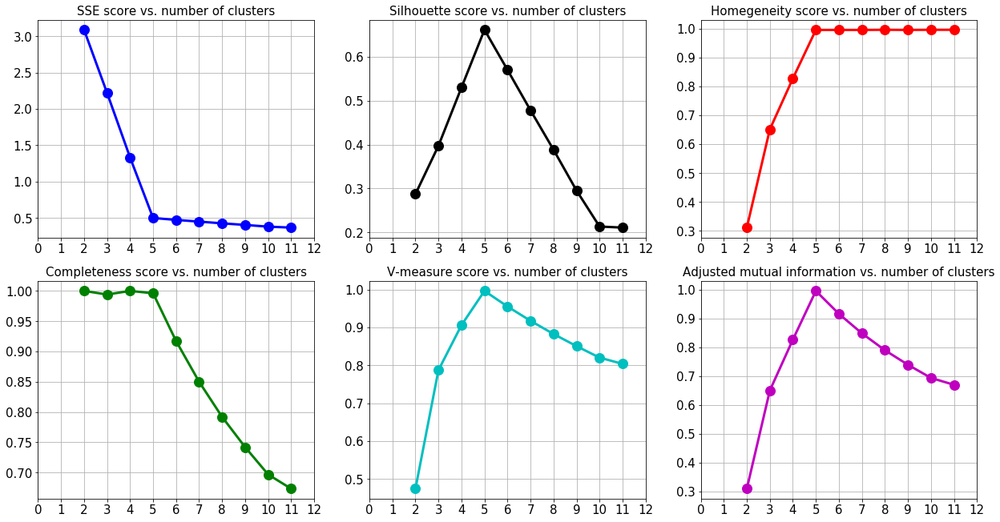

In [382]:
plt.figure(figsize=(21,11))

#SSE
plt.subplot(2,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

### K-means fitting with ICA-transformed data

In [383]:
t1=time.time()
km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
t2=time.time()
time_km_ica = t2-t1

# Predictions
preds_km_ica = km_ica.predict(X_ica)

### Visualizing the clusters after running k-means on ICA-transformed features

In [384]:
col_ica_combi=list(combinations(df_ica.columns,2))
num_ica_combi = len(col_ica_combi)

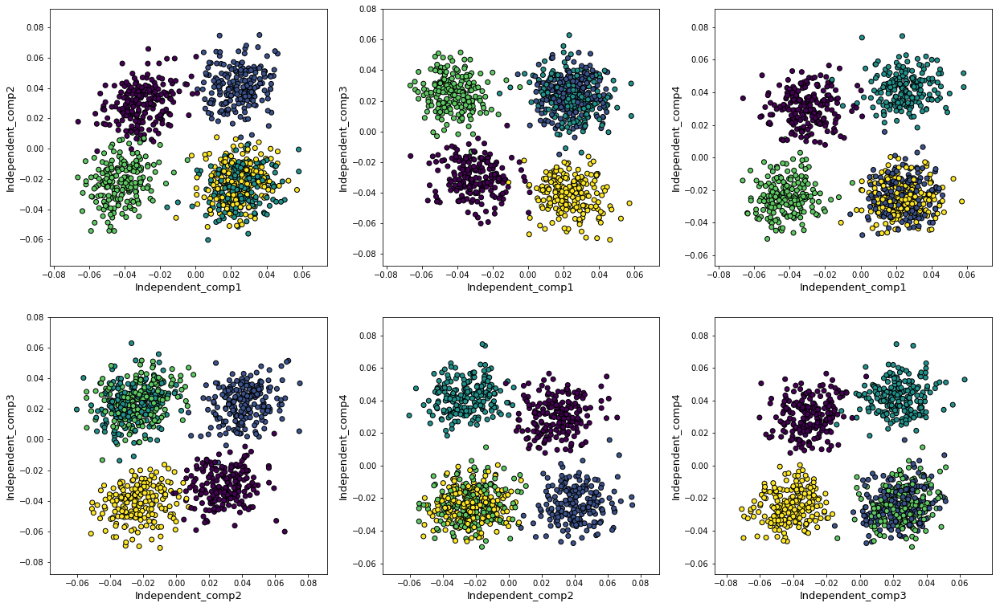

In [386]:
plt.figure(figsize=(21,20))
for i in range(1,num_ica_combi+1):
    plt.subplot(int(num_ica_combi/3)+1,3,i)
    dim1=col_ica_combi[i-1][0]
    dim2=col_ica_combi[i-1][1]
    plt.scatter(df_ica[dim1],df_ica[dim2],c=preds_km_ica,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

### Estimating average running time of k-means with ICA

In [415]:
time_km_ica = []
for i in range(100):
    t1=time.time()
    km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
    t2= time.time()
    delta = t2-t1
    time_km_ica.append(delta)
time_km_ica = np.array(time_km_ica)
avg_time_km_ica = time_km_ica.mean()
print(avg_time_km_ica)

0.026175713539123534


## Random Projection

In [154]:
from sklearn.random_projection import GaussianRandomProjection

In [155]:
n_random_comp = 7

In [156]:
random_proj = GaussianRandomProjection(n_components=n_random_comp)

In [157]:
X_random_proj = random_proj.fit_transform(X_scaled)

In [158]:
df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])

### Running k-means on random projections

In [159]:
km_sse= []
km_silhouette = []
km_vmeasure =[]
km_ami = []
km_homogeneity = []
km_completeness = []

cluster_range = (2,12)

for i in range(cluster_range[0],cluster_range[1]):
    km = KMeans(n_clusters=i, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    km_sse.append(-km.score(X_random_proj))
    km_silhouette.append(silhouette_score(X_random_proj,preds))
    km_vmeasure.append(v_measure_score(y,preds))
    km_ami.append(adjusted_mutual_info_score(y,preds))
    km_homogeneity.append(homogeneity_score(y,preds))
    km_completeness.append(completeness_score(y,preds))
    print(f"Done for cluster {i}")

Done for cluster 2
Done for cluster 3
Done for cluster 4
Done for cluster 5
Done for cluster 6
Done for cluster 7
Done for cluster 8
Done for cluster 9
Done for cluster 10
Done for cluster 11


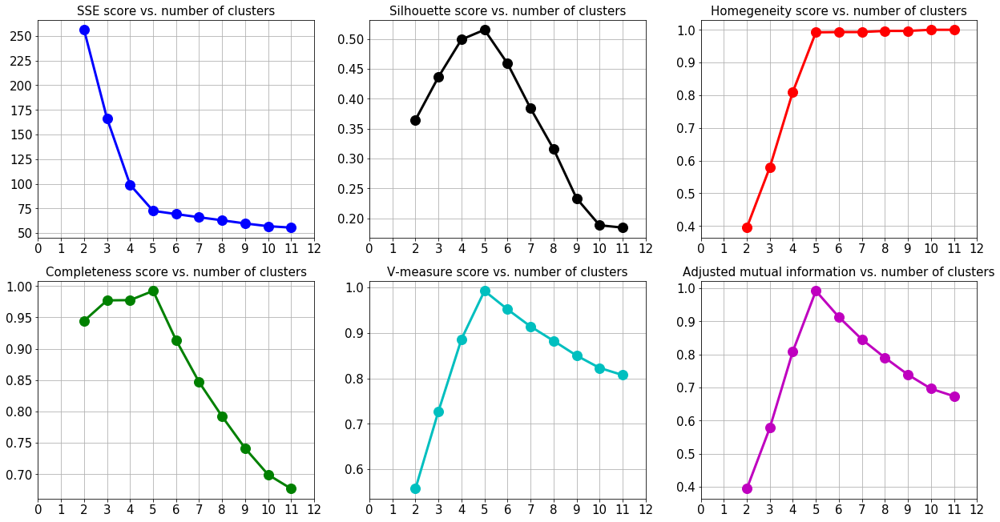

In [160]:
plt.figure(figsize=(21,11))

#SSE
plt.subplot(2,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

### How the number of random projections affect clustering

c:\users\tirtha\python\anaconda3\lib\site-packages\matplotlib\cbook\deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)
c:\users\tirtha\python\anaconda3\lib\site-packages\sklearn\random_projection.py:378: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (8 < 9).The dimensionality of the problem will not be reduced.
  DataDimensionalityWarning)


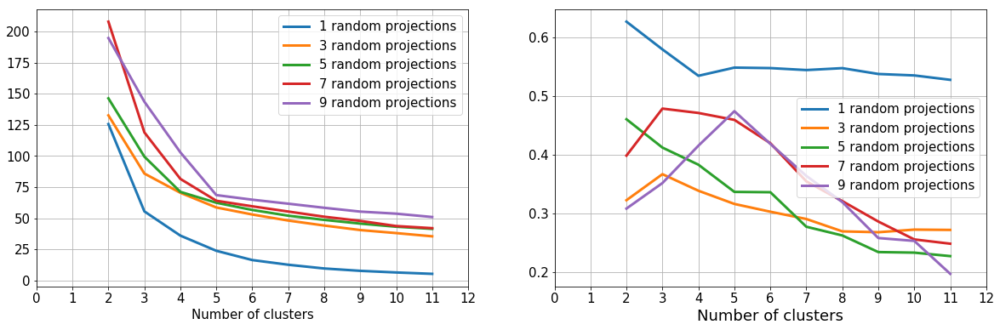

In [153]:
plt.figure(figsize=(20,6))
plt.title("SSE score vs. number of clusters for various random projections",fontsize=15)
for n in range(1,10,2):
    n_random_comp = n
    rp = GaussianRandomProjection(n_components=n_random_comp)
    X_rp = rp.fit_transform(X_scaled)
    #df_rp=pd.DataFrame(data=X_rp,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    km_sse= []
    km_silhouette = []
    cluster_range = (2,12)
    for i in range(cluster_range[0],cluster_range[1]):
        km = KMeans(n_clusters=i, random_state=0).fit(X_rp)
        preds = km.predict(X_rp)
        km_sse.append(-km.score(X_rp))
        km_silhouette.append(silhouette_score(X_rp,preds))
    # SSE plot
    plt.subplot(1,2,1)
    plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,linewidth=3)
    plt.grid(True)    
    plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel("Number of clusters", fontsize=15)
    plt.legend([str(n)+" random projections" for n in range(1,10,2)],fontsize=15)
    # Silhouette plot
    plt.subplot(1,2,2)
    plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_silhouette,linewidth=3)
    plt.grid(True)
    plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel("Number of clusters", fontsize=18)
    plt.legend([str(n)+" random projections" for n in range(1,10,2)],fontsize=15)
plt.show()

### K-means fitting with random-projected data

In [161]:
t1=time.time()
km_random_proj = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_random_proj)
t2=time.time()
time_km_rp = t2-t1
preds_km_random_proj = km_random_proj.predict(X_random_proj)

### Visualizing the clusters after running k-means on random-projected features

In [162]:
col_random_proj_combi=list(combinations(df_random_proj.columns,2))
num_random_proj_combi = len(col_random_proj_combi)

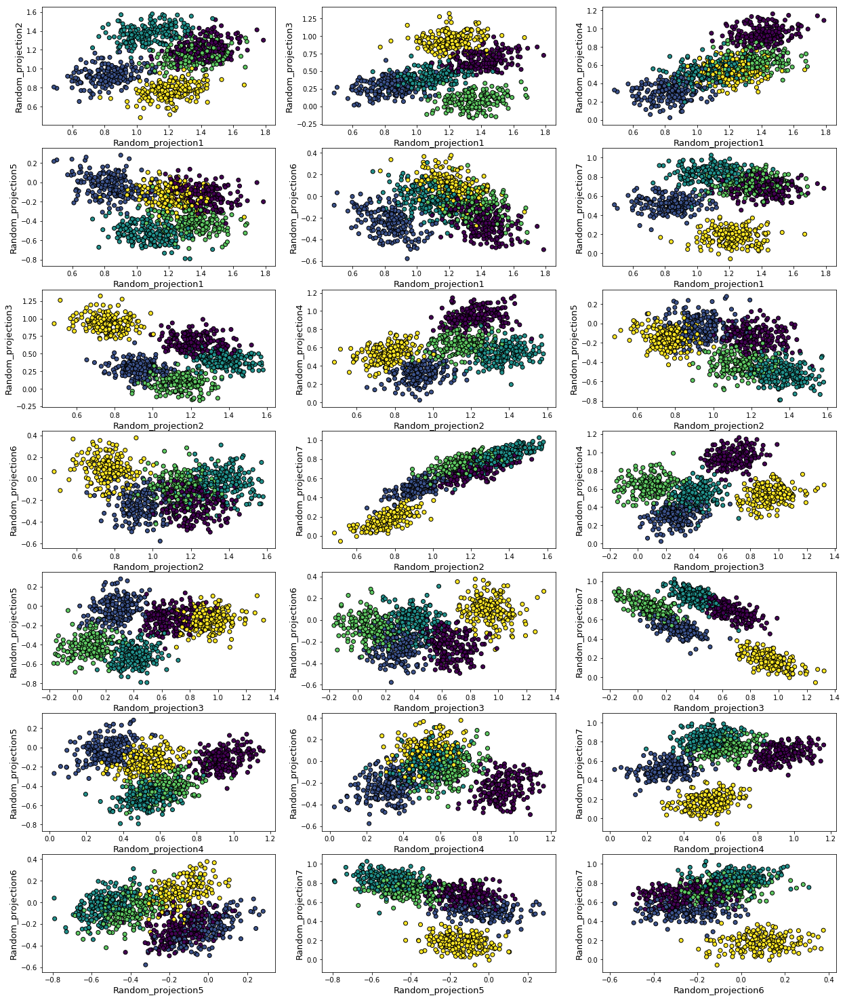

In [164]:
plt.figure(figsize=(21,30))
for i in range(1,num_random_proj_combi+1):
    plt.subplot(int(num_random_proj_combi/3)+1,3,i)
    dim1=col_random_proj_combi[i-1][0]
    dim2=col_random_proj_combi[i-1][1]
    plt.scatter(df_random_proj[dim1],df_random_proj[dim2],c=preds_km_random_proj,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)
plt.show()

### Estimating average running time of k-means with random projections

In [165]:
time_km_rp = []
for i in range(100):
    t1=time.time()
    km_rp = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_random_proj)
    t2= time.time()
    delta = t2-t1
    time_km_rp.append(delta)
time_km_rp = np.array(time_km_rp)
avg_time_km_rp = time_km_rp.mean()
print(avg_time_km_rp)

0.040059175491333004


In [166]:
def plot_cluster_rp(df_rp,preds_rp):
    """
    Plots clusters after running random projection
    """
    plt.figure(figsize=(21,12))
    for i in range(1,num_random_proj_combi+1):
        plt.subplot(int(num_random_proj_combi/3)+1,3,i)
        dim1=col_random_proj_combi[i-1][0]
        dim2=col_random_proj_combi[i-1][1]
        plt.scatter(df_rp[dim1],df_rp[dim2],c=preds_rp,edgecolor='k')
        plt.xlabel(f"{dim1}",fontsize=13)
        plt.ylabel(f"{dim2}",fontsize=13)
    plt.show()

### Running the random projections many times

In [228]:
rp_score= []
rp_silhouette = []
rp_vmeasure = []
n_random_comp = 7
for i in range(100):
    random_proj = GaussianRandomProjection(n_components=n_random_comp)
    X_random_proj = random_proj.fit_transform(X_scaled)
    df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    
    km = KMeans(n_clusters=5, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    #print("Score for iteration {}: {}".format(i,km.score(X_random_proj)))
    rp_score.append(-km.score(X_random_proj))
    
    silhouette = silhouette_score(X_random_proj,preds)
    rp_silhouette.append(silhouette)
    #print("Silhouette score for iteration {}: {}".format(i,silhouette))
    
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    #print("V-measure score for iteration {}: {}".format(i,v_measure))
    #print("-"*100)
    
    #plot_cluster_rp(df_random_proj,preds)
    if (i%10==0):
        print("Done for {}".format(i))

Done for 0
Done for 10
Done for 20
Done for 30
Done for 40
Done for 50
Done for 60
Done for 70
Done for 80
Done for 90


In [229]:
rp_score=np.array(rp_score)

In [230]:
rp_score_scaled = rp_score/100

In [231]:
rp_score_scaled

array([0.78528777, 0.87139668, 0.61220371, 0.75874571, 0.77137687,
       0.68181367, 0.93827099, 0.72325971, 0.72229991, 0.43205996,
       0.90061077, 0.63479796, 0.49969737, 0.82569285, 0.7215516 ,
       0.73865184, 0.79022737, 0.87495675, 0.69704979, 0.60258458,
       0.5950588 , 0.91122543, 0.75026396, 0.70214603, 0.38970088,
       0.61943504, 0.83644333, 0.58993675, 0.65742577, 0.77780779,
       0.67109482, 0.67857729, 0.86692705, 0.65368955, 0.66721044,
       0.68573296, 0.72374905, 0.6045452 , 0.71555715, 0.88601165,
       0.66012975, 0.63138891, 0.83228528, 0.5281966 , 0.6042584 ,
       0.41568702, 0.58156503, 0.72867399, 0.6037026 , 0.80008004,
       0.55636814, 0.64971775, 0.53822722, 0.8411551 , 0.65328258,
       0.58678972, 0.94448528, 0.9127625 , 0.73586805, 0.66011284,
       0.70088756, 0.80272885, 0.49664237, 0.63807443, 0.7729946 ,
       0.76277927, 0.59962188, 0.66164753, 0.65624673, 0.63930593,
       0.64020584, 0.67979366, 0.62112923, 0.79631762, 0.59948

In [232]:
rp_variations = {"SSE score":rp_score_scaled,"Silhouette score":rp_silhouette,"V measure":rp_vmeasure}

In [233]:
df_rp_variations = pd.DataFrame(rp_variations)
df_rp_variations.head()

,SSE score,Silhouette score,V measure
0,0.785288,0.451709,0.930376
1,0.871397,0.360424,0.845930
2,0.612204,0.518936,0.963821
3,0.758746,0.474915,0.974668
4,0.771377,0.471487,0.962948


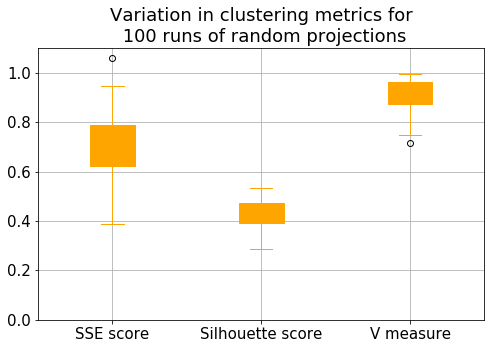

In [252]:
df_rp_variations.plot.box(figsize=(8,5),patch_artist=True,color='orange')
plt.title("Variation in clustering metrics for\n 100 runs of random projections",fontsize=18)
plt.grid(True)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylim(0,1.1)
plt.show()

### This kind of variation does not happen with PCA

In [93]:
pca_score= []
pca_silhouette = []
pca_vmeasure = []
for i in range(20):
    pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
    X_pca=pca_partial.fit_transform(X_scaled)
    km = KMeans(n_clusters=5, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for iteration {}: {}".format(i,km.score(X_pca)))
    rp_score.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)

Score for iteration 0: -15.241631689819005
Silhouette score for iteration 0: 0.6632590191463824
V-measure score for iteration 0: 0.9484507576804644
----------------------------------------------------------------------------------------------------
Score for iteration 1: -15.241631689819005
Silhouette score for iteration 1: 0.6632590191463824
V-measure score for iteration 1: 0.9484507576804644
----------------------------------------------------------------------------------------------------
Score for iteration 2: -15.241631689819005
Silhouette score for iteration 2: 0.6632590191463824
V-measure score for iteration 2: 0.9484507576804644
----------------------------------------------------------------------------------------------------
Score for iteration 3: -15.241631689819005
Silhouette score for iteration 3: 0.6632590191463824
V-measure score for iteration 3: 0.9484507576804644
----------------------------------------------------------------------------------------------------
Scor

### Testing cluster accuracy function

In [239]:
def cluster_acc(Y,clusterLabels):
    import numpy as np
    from collections import Counter
    from sklearn.metrics import accuracy_score as acc
    assert (Y.shape == clusterLabels.shape)
    pred = np.empty_like(Y)
    for label in set(clusterLabels):
        mask = clusterLabels == label
        sub = Y[mask]
        target = Counter(sub).most_common(1)[0][0]
        pred[mask] = target
#    assert max(pred) == max(Y)
#    assert min(pred) == min(Y)    
    return acc(Y,pred)

In [312]:
adjusted_rand_score(y,preds_gm)

0.9974962343264018

In [313]:
adjusted_rand_score(y,preds_km)

0.9974962343264018

In [314]:
adjusted_rand_score(y,preds_km_pca)

0.9974962343264018

In [315]:
adjusted_rand_score(y,preds_km_ica)

0.9974962343264018

In [316]:
adjusted_rand_score(y,preds_km_random_proj)

0.4383745312055603

## Feature selection

In [243]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

print(X_scaled.shape)

clf = RandomForestClassifier(n_estimators=100,max_depth=3)
clf = clf.fit(X_scaled, y)
clf.feature_importances_  

model = SelectFromModel(clf, prefit=True)
X_fs = model.transform(X_scaled)

print(X_fs.shape)

fs_dim = X_fs.shape[1]

(1000, 8)
(1000, 4)


In [245]:
df_fs = pd.DataFrame(X_fs,columns=['Selected_comp'+str(i) for i in range(1,fs_dim+1)])
df_fs.head()

,Selected_comp1,Selected_comp2,Selected_comp3,Selected_comp4
0,0.114751,0.420915,0.750887,0.250643
1,0.547237,0.584586,0.280696,0.136192
2,0.519209,0.137030,0.354014,0.663834
3,0.493499,0.193626,0.301972,0.788242
4,0.745503,0.472527,0.623544,0.572073


In [250]:
df_scaled = pd.DataFrame(X_scaled,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
df_scaled.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,0.806891,0.114751,0.420915,0.582914,0.198045,0.635016,0.750887,0.250643
1,0.368329,0.547237,0.584586,0.516857,0.612660,0.352381,0.280696,0.136192
2,0.485913,0.519209,0.137030,0.289284,0.554678,0.980038,0.354014,0.663834
3,0.693180,0.493499,0.193626,0.475527,0.618394,0.468651,0.301972,0.788242
4,0.360613,0.745503,0.472527,0.869017,0.602161,0.455575,0.623544,0.572073


### Running k-means on new transformed dataset after feature selection

In [447]:
km_sse= []
km_silhouette = []
km_vmeasure =[]
km_ami = []
km_homogeneity = []
km_completeness = []

cluster_range = (2,12)

for i in range(cluster_range[0],cluster_range[1]):
    km = KMeans(n_clusters=i, random_state=0).fit(X_fs)
    preds = km.predict(X_fs)
    km_sse.append(-km.score(X_fs))
    km_silhouette.append(silhouette_score(X_fs,preds))
    km_vmeasure.append(v_measure_score(y,preds))
    km_ami.append(adjusted_mutual_info_score(y,preds))
    km_homogeneity.append(homogeneity_score(y,preds))
    km_completeness.append(completeness_score(y,preds))
    print(f"Done for cluster {i}")

Done for cluster 2
Done for cluster 3
Done for cluster 4
Done for cluster 5
Done for cluster 6
Done for cluster 7
Done for cluster 8
Done for cluster 9
Done for cluster 10
Done for cluster 11


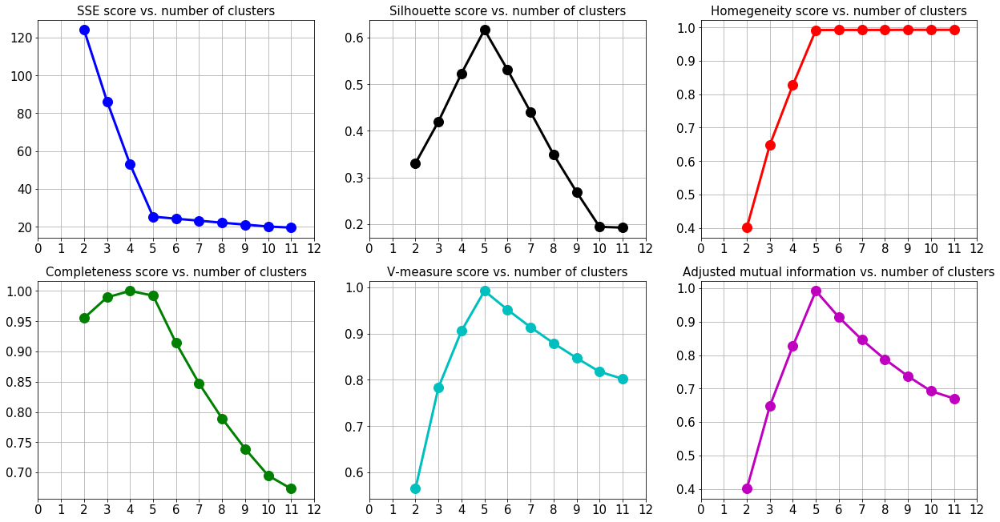

In [448]:
plt.figure(figsize=(21,11))

#SSE
plt.subplot(2,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

### Visualizing the clusters after feature selection

In [246]:
t1=time.time()
km_fs = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_fs)
t2=time.time()
time_km_fs = t2-t1

# Predictions
preds_km_fs = km_fs.predict(X_fs)

In [247]:
col_fs_combi=list(combinations(df_fs.columns,2))
num_fs_combi = len(col_fs_combi)

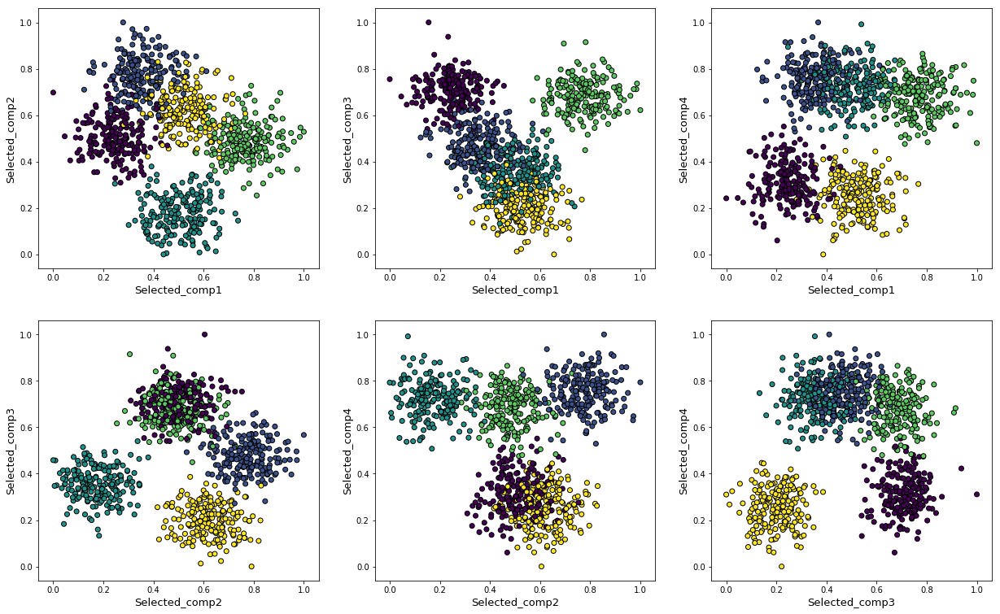

In [248]:
plt.figure(figsize=(21,20))
for i in range(1,num_fs_combi+1):
    plt.subplot(int(num_fs_combi/3)+1,3,i)
    dim1=col_fs_combi[i-1][0]
    dim2=col_fs_combi[i-1][1]
    plt.scatter(df_fs[dim1],df_fs[dim2],c=preds_km_fs,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)